## INTRODUCTION 

#### About K-Nearest Neighbors (KNN)

K-Nearest Neighbors (KNN) is one of the simplest algorithms used in Machine Learning for regression and classification problem. KNN algorithms use data and classify new data points based on similarity measures (e.g. distance function).

Classification is done by a majority vote to its neighbors. The data is assigned to the class which has the nearest neighbors. As you increase the number of nearest neighbors, the value of k, accuracy might increase.

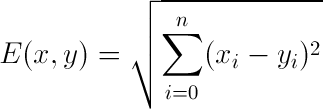

#### Now lets also use the KNN to also Predict Alzheimer Disease

In [1]:
!pip install dataprep by

     |████████████████████████████████| 3.5 MB 9.3 MB/s 
     |████████████████████████████████| 1.5 MB 46.0 MB/s 
     |████████████████████████████████| 10.1 MB 50.7 MB/s 
     |████████████████████████████████| 366 kB 57.1 MB/s 
     |████████████████████████████████| 848 kB 32.5 MB/s 
     |████████████████████████████████| 158 kB 50.7 MB/s 
     |████████████████████████████████| 63 kB 2.5 MB/s 
     |████████████████████████████████| 943 kB 56.6 MB/s 
     |████████████████████████████████| 1.1 MB 56.2 MB/s 
     |████████████████████████████████| 719 kB 56.6 MB/s 
     |████████████████████████████████| 271 kB 71.2 MB/s 
     |████████████████████████████████| 160 kB 53.8 MB/s 
     |████████████████████████████████| 192 kB 62.4 MB/s 
     |████████████████████████████████| 132 kB 74.2 MB/s 
     |████████████████████████████████| 49 kB 6.5 MB/s 
     |████████████████████████████████| 1.5 MB 73.0 MB/s 
     |████████████████████████████████| 743 kB 58.1 MB/s 
  Created wheel fo

In [2]:
%matplotlib inline
import keras
import glob
import seaborn as sns
import pandas as pd
import numpy as np
import timeit
import time
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from pandas import read_csv
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.preprocessing import LabelEncoder
from sklearn.pipeline import Pipeline
from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasClassifier
from keras.utils import np_utils

In [3]:
dataset=pd.read_csv('/content/FMRI.csv') 
dataset = dataset.fillna(method='ffill')
dataset.head()

,ID,M/F,Hand,Age,Educ,SES,MMSE,CDR,eTIV,nWBV,ASF,Delay
0,OAS1_0001_MR1,F,R,74,2.0,3.0,29.0,0.0,1344,0.743,1.306,NaN
1,OAS1_0002_MR1,F,R,55,4.0,1.0,29.0,0.0,1147,0.810,1.531,NaN
2,OAS1_0003_MR1,F,R,73,4.0,3.0,27.0,0.5,1454,0.708,1.207,NaN
3,OAS1_0004_MR1,M,R,28,4.0,3.0,27.0,0.5,1588,0.803,1.105,NaN
4,OAS1_0005_MR1,M,R,18,4.0,3.0,27.0,0.5,1737,0.848,1.010,NaN


# Data Visualization and Preprocessing

In [4]:
dataset.shape

(436, 12)

In [5]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 436 entries, 0 to 435
Data columns (total 12 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   ID      436 non-null    object 
 1   M/F     436 non-null    object 
 2   Hand    436 non-null    object 
 3   Age     436 non-null    int64  
 4   Educ    436 non-null    float64
 5   SES     436 non-null    float64
 6   MMSE    436 non-null    float64
 7   CDR     436 non-null    float64
 8   eTIV    436 non-null    int64  
 9   nWBV    436 non-null    float64
 10  ASF     436 non-null    float64
 11  Delay   20 non-null     float64
dtypes: float64(7), int64(2), object(3)
memory usage: 41.0+ KB


Populating the interactive namespace from numpy and matplotlib


/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:2076: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


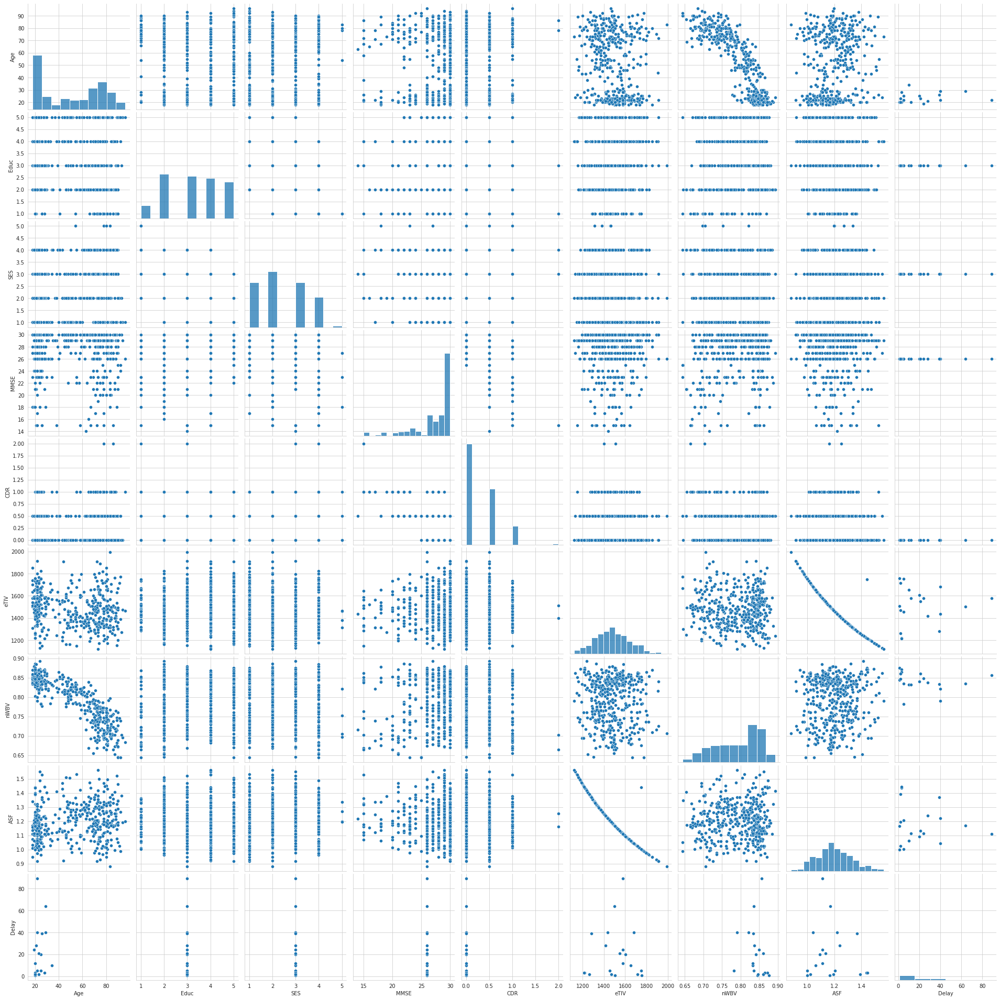

In [6]:
%pylab inline
#lets plot some graphics from the first dataset

from pylab import rcParams
rcParams['figure.figsize'] = 8, 5
cols = ['Age','MR Delay', 'EDUC', 'SES', 'MMSE', 'CDR','eTIV','nWBV','ASF']
x=dataset.fillna('')
sns.set_style("whitegrid");
sns.pairplot(dataset,  size=3);
plt.show()

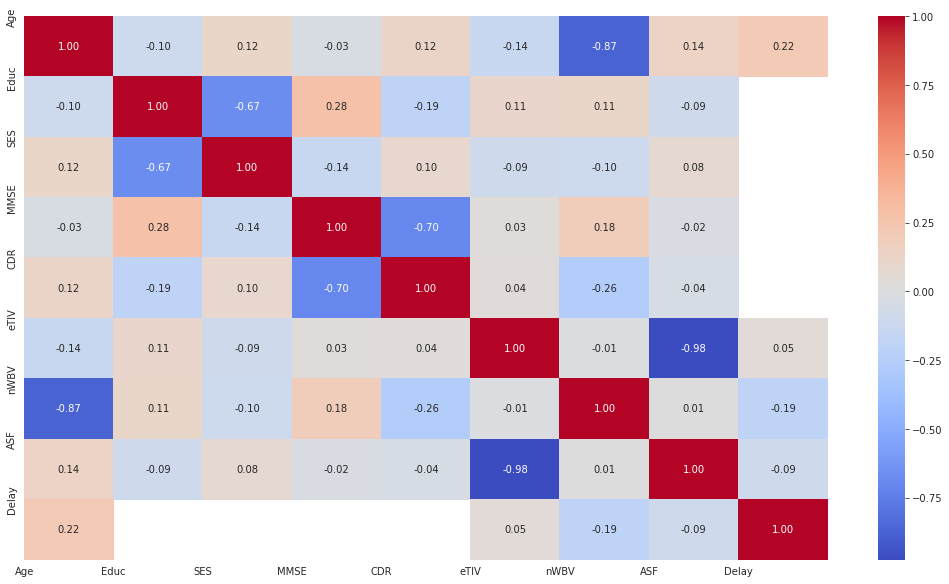

In [7]:
corr = dataset.corr()
fig, ax = plt.subplots(figsize=(18, 10))
sns.heatmap(corr, cmap='coolwarm', annot=True, fmt=".2f")
plt.xticks(range(len(corr.columns)), corr.columns)
plt.yticks(range(len(corr.columns)), corr.columns)
plt.show()

In [8]:
dataset.isnull().sum()

ID         0
M/F        0
Hand       0
Age        0
Educ       0
SES        0
MMSE       0
CDR        0
eTIV       0
nWBV       0
ASF        0
Delay    416
dtype: int64

In [9]:
#cdr=dataset["CDR"]
dataset['CDR'].replace(to_replace=0.0, value='A', inplace=True)
dataset['CDR'].replace(to_replace=0.5, value='B', inplace=True)
dataset['CDR'].replace(to_replace=1.0, value='C', inplace=True)
dataset['CDR'].replace(to_replace=2.0, value='D', inplace=True)

In [10]:
from sklearn.preprocessing import LabelEncoder
#from sklearn.cross_validation import train_test_split
for x in dataset.columns:
    f = LabelEncoder()
    dataset[x] = f.fit_transform(dataset[x])

In [11]:
dataset.head()

,ID,M/F,Hand,Age,Educ,SES,MMSE,CDR,eTIV,nWBV,ASF,Delay
0,0,0,0,51,1,2,15,0,67,62,214,14
1,1,0,0,33,3,0,15,0,2,115,279,14
2,2,0,0,50,3,2,13,1,140,34,148,14
3,3,1,0,10,3,2,13,1,228,109,73,14
4,4,1,0,0,3,2,13,1,284,151,24,14


## Outlier analysis

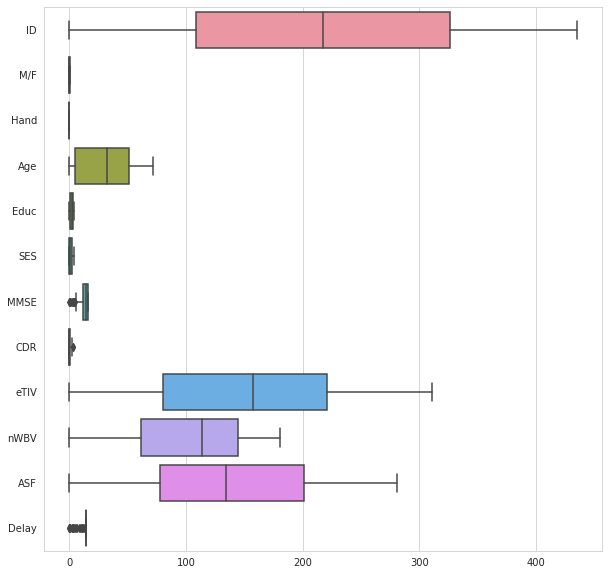

In [12]:
plt.figure(figsize=(10,10))
sns.boxplot(data=dataset, orient="h");

In [13]:
from dataprep.eda import *
from dataprep.eda import plot
from dataprep.eda import plot_correlation
from dataprep.eda import plot_missing
import plotly.express as px
import plotly.figure_factory as ff


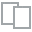
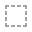
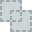
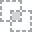
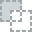
...
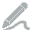
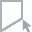
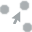
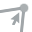
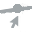

In [14]:
plot(dataset)


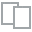
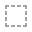
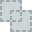
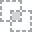
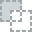
...
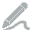
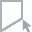
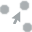
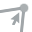
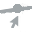

In [15]:
plot(dataset, 'eTIV')

DataPrep Report
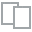
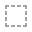
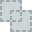
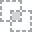
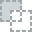
...
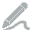
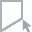
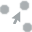
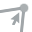
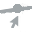

In [16]:
create_report(dataset)

# Lets begin some machine learning

In [17]:
from sklearn.model_selection import train_test_split
train, test = train_test_split(dataset, test_size=0.2)
X_train = train[['M/F', 'Age', 'SES',  'eTIV', 'ASF']]
y_train = train.CDR
X_test = test[['M/F', 'Age',  'SES',  'eTIV',  'ASF']]
y_test = test.CDR

In [18]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

In [19]:
y_train=np.ravel(y_train)
X_train=np.asarray(X_train)
y_test=np.ravel(y_test)
X_test=np.asarray(X_test)

In [20]:
!pip install catboost
!pip install xgboost
!pip install lightgbm

     |████████████████████████████████| 76.3 MB 1.2 MB/s 


In [52]:
global df
df =pd.DataFrame(columns=['Algorithm','Train_accuracy','Train_precision','Train_recall','Train_F1_Score',
                         'Validation_accuracy','Validation_precision','Validation_recall','Validation_F1_Score'])
def add_result(model, X_train, y_train, X_test, y_test,name):
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    global df
    df = df.append({'Algorithm':name,
                    'Train_accuracy':accuracy_score(y_train,y_pred_train),
                    'Train_precision':precision_score(y_train,y_pred_train, average='weighted'),
                    'Train_recall':recall_score(y_train,y_pred_train, average='weighted'),
                    'Train_F1_Score':f1_score(y_train,y_pred_train, average='weighted'),
                    'Validation_accuracy':accuracy_score(y_test,y_pred_test),
                    'Validation_precision':precision_score(y_test,y_pred_test, average='weighted'),
                    'Validation_recall':recall_score(y_test,y_pred_test, average='weighted'),
                    'Validation_F1_Score':f1_score(y_test,y_pred_test, average='weighted'),
                       },ignore_index=True)

df

,Algorithm,Train_accuracy,Train_precision,Train_recall,Train_F1_Score,Validation_accuracy,Validation_precision,Validation_recall,Validation_F1_Score


In [53]:
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import accuracy_score
import warnings
warnings.filterwarnings("ignore")
def KNN(X_train,y_train,X_test,y_test):
    from sklearn.neighbors import  KNeighborsClassifier
    from sklearn.pipeline import Pipeline
    clf= KNeighborsClassifier(n_neighbors=2)
    clf.fit(X_train, y_train) 
    add_result(clf,X_train,y_train,X_test,y_test,'KNN')
    print("----------KNN----------")
    return clf
def ML(X_train,y_train,X_test,y_test):
    return KNN(X_train,y_train,X_test,y_test)
    # SGD(X_train,y_train,X_test,y_test)
    # svm_scale(X_train,y_train,X_test,y_test)
    # svm_auto(X_train,y_train,X_test,y_test)
    # LinearSVC(X_train,y_train,X_test,y_test)
    # KNN(X_train,y_train,X_test,y_test)
    # Gaussian(X_train,y_train,X_test,y_test)
    # Bernouli(X_train,y_train,X_test,y_test)
    # Tree(X_train,y_train,X_test,y_test)
    # RandomForest(X_train,y_train,X_test,y_test)
    # Adaboost(X_train,y_train,X_test,y_test)
    # Gradient(X_train,y_train,X_test,y_test)
    # XGB(X_train,y_train,X_test,y_test)
    # Cat(X_train,y_train,X_test,y_test)
    # Light(X_train,y_train,X_test,y_test)

In [54]:
mod = ML(X_train,y_train,X_test,y_test)

----------KNN----------


In [55]:
df.sort_values(by=['Train_accuracy','Validation_accuracy'],ascending=False)

,Algorithm,Train_accuracy,Train_precision,Train_recall,Train_F1_Score,Validation_accuracy,Validation_precision,Validation_recall,Validation_F1_Score
0,KNN,0.741379,0.757733,0.741379,0.6976,0.534091,0.479553,0.534091,0.482258


In [49]:
df.to_csv('FMRI_ALGO_Data.csv',index = False)

In [50]:
from sklearn import metrics
def plot_confusion_metrix(y_test,model_test):
    cm = metrics.confusion_matrix(y_test, model_test)
    plt.figure(1)
    plt.clf()
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Wistia)
    classNames = ['Nondemented','Demented']
    plt.title('Confusion Matrix')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    tick_marks = np.arange(len(classNames))
    plt.xticks(tick_marks, classNames)
    plt.yticks(tick_marks, classNames)
    s = [['TN','FP'], ['FN', 'TP']]
    for i in range(2):
        for j in range(2):
            plt.text(j,i, str(s[i][j])+" = "+str(cm[i][j]))
    plt.show()
from sklearn.metrics import roc_curve, auc
def report_performance(model):

    model_test = model.predict(X_test)

    print("\n\nConfusion Matrix:")
    print("{0}".format(metrics.confusion_matrix(y_test, model_test)))
    print("\n\nClassification Report: ")
    print(metrics.classification_report(y_test, model_test))
    #cm = metrics.confusion_matrix(y_test, model_test)
    plot_confusion_metrix(y_test, model_test)

total_fpr = {}
total_tpr = {}
def roc_curves(model):
    predictions_test = model.predict(X_test)
    fpr, tpr, thresholds = roc_curve(predictions_test,y_test)
    roc_auc = auc(fpr, tpr)
    total_fpr[str((str(model).split('(')[0]))] = fpr
    total_tpr[str((str(model).split('(')[0]))] = tpr
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=1, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic')
    plt.legend(loc="lower right")
    plt.show()
total_accuracy = {}
def accuracy(model):
    pred = model.predict(X_test)
    accu = metrics.accuracy_score(y_test,pred)
    print("\nAcuuracy Of the Model: ",accu,"\n\n")
    total_accuracy[str((str(model).split('(')[0]))] = accu



Confusion Matrix:
[[41 10  0]
 [27  6  1]
 [ 3  0  0]]


Classification Report: 
              precision    recall  f1-score   support

           0       0.58      0.80      0.67        51
           1       0.38      0.18      0.24        34
           2       0.00      0.00      0.00         3

    accuracy                           0.53        88
   macro avg       0.32      0.33      0.30        88
weighted avg       0.48      0.53      0.48        88



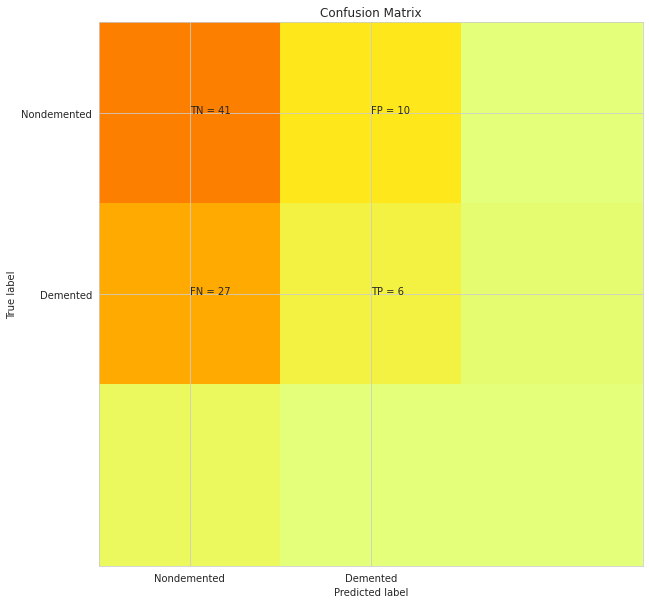


Acuuracy Of the Model:  0.5340909090909091 




In [57]:
rfc = mod
report_performance(rfc) 
#roc_curves(rfc)
accuracy(rfc)